In [1]:
import torch
import pandas as pd
from torch import nn
from torchvision import transforms

from functools import partial

from collections import defaultdict



import re, math, sys
import numpy as np
import random

import os
from tqdm import tqdm

from PIL import Image
import importlib

from matplotlib import pyplot as plt

# model specific
from transformers import CLIPProcessor, CLIPModel


# This file only exists to create illustrations fo the SHAP process for one image with CLIP 

## **Do not export any data!**

### Load data

In [2]:
stimuli_df = None
import utils
importlib.reload(utils)
stimuli_df = utils.STIMULI_DF

# add an extra "../" tot he data paths to create ../../VALSE_data
stimuli_df['img_path'] = [os.path.join("..",path) for path in stimuli_df['img_path']]

stimuli_df.head(2)


,index,Unnamed: 0,Selection,img_path,caption,foil,linguistic_phenomena,Approval,Notes,clip_pred_caption,clip_pred_foil,clip_pred_diff,performance_group,"% can't tell (google form, existence only)","% can tell (google form, existence only)","% unsure (google form, existence only)",Caption edited,Foil edited
0,0,213,"Existence set (Jan 16, validated thru Google F...",../../VALSE_data/images/v7w/v7w_2318073.jpg,There is at least one light.,There are no lights.,existence,Approve,"40% can't answer based on blurrred image, 40% ...",22.074354,21.428589,0.645765,medium_perf,40.0,40.0,20.0,True,False
1,1,214,"Existence set (Jan 16, validated thru Google F...",../../VALSE_data/images/v7w/v7w_2323857.jpg,There is fruit.,There is no fruit.,existence,Approve,"40% can't tell, <=20% can tell",24.527332,24.772640,-0.245308,low_perf,40.0,20.0,40.0,True,True


### Load model

In [3]:
global model
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
model_name = "CLIP"

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/torch/_utils.py:776: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


In [4]:
processor

CLIPProcessor:
- image_processor: CLIPImageProcessor {
  "crop_size": {
    "height": 224,
    "width": 224
  },
  "do_center_crop": true,
  "do_convert_rgb": true,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.48145466,
    0.4578275,
    0.40821073
  ],
  "image_processor_type": "CLIPImageProcessor",
  "image_std": [
    0.26862954,
    0.26130258,
    0.27577711
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}

- tokenizer: CLIPTokenizerFast(name_or_path='openai/clip-vit-base-patch32', vocab_size=49408, model_max_length=77, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<|startoftext|>', 'eos_token': '<|endoftext|>', 'unk_token': '<|endoftext|>', 'pad_token': '<|endoftext|>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	49406: AddedToken("<|startoftext|>", rstrip=False, lstrip=False, single_word=False, normalized=True, spe

### Define model prediction function (for SHAP -- taking list of images and caption/foil as input)

In [5]:
text_out = []

def model_predict(images, caption, foil):
    """Needs CAPTION and FOIL to be defined outside the function,
    they are kept constant within the function
    
    In practice SHAP will pass a SINGLE image in this step, so images = [image]"""

    global model

    processed = processor(text = [caption, foil],
                          images = images,
                          return_tensors = 'pt',
                          padding = True
                          )
    
    text_out.append(f"Processing SHAP with {caption} and {foil}")
    
    with torch.no_grad():
        outputs = model(**processed).logits_per_image # generatre logits for caption and foil for each image
        # Assuming the first score is for caption and second for foil
        score_diff = outputs[:, 0] - outputs[:, 1]  
    return score_diff.numpy() # this generates a caption-foil difference for each image in images

### Define model output caption for dataframes (taking dataframe as input)

Difference: the SHAP prediction function works with a list of images for a single set of captions. 

This one works with a dataframe where each SINGLE image is paired with one caption/foil and an output generated.

In [6]:
def model_output_dataframe(df):
    
    """Given a dataframe of images, captions, and foils, returns a dataframe of model outputs, one for each row in the dataframe"""

    results = defaultdict(list)

    for _, row in tqdm(df.iterrows()):

        # copy over those things that should be copied directly
        for name in ["img_path", "caption", "foil", "linguistic_phenomena"]:
            results[name].append(row[name])

        # prepare data point as inputs to test model on
        image = Image.open(row["img_path"])

        test_sentences = [row["caption"],
                        row["foil"]]
        
        # create CLIP input with BOTH captions
        try:
            inputs = processor(
                text = test_sentences,
                images = image,
                return_tensors = 'pt',
                padding = True
            )

        except:
            print(f"Trouble processing {row['img_path']}")
            continue
        
        clip_logits = model(**inputs).logits_per_image[0,0:2].tolist()
        clip_cap_foil_diff = clip_logits[0] - clip_logits[1]

        # save relevant fields to the dictionary to either {caption} or {foil} (based on which it is)
        results["model_pred_caption"].append(clip_logits[0]) # logit
        results["model_pred_foil"].append(clip_logits[1])
        results["model_pred_diff"].append(clip_cap_foil_diff)
    
    model_output = pd.DataFrame.from_dict(results)

    return model_output

## Build SHAP pipeline

### Masking functions

In [7]:
from shap_functions import vector_to_masked_images, blur_image


### Test masking

In [8]:
# image = Image.open("../../VALSE_data/images/coco2017/000000122672.jpg")
# image = np.array(image.resize((224,224)))

# blurred_image = blur_image(image)

# test_mask_array = np.array([
#     [1, 0, 0, 1],
#     [0, 1, 1, 0],
#     [1, 0, 0, 0],
#     [0, 0, 1, 0]
# ])

# masked_img = vector_to_masked_images([test_mask_array], image, blurred_image, N_ROWS=4)[0]
# plt.imshow(masked_img)

### SHAP function

In [9]:
import shap_functions
importlib.reload(shap_functions)

<module 'shap_functions' from '/Users/eduardsaakashvili/Desktop/UU/Thesis/code/es-thesis-repo/data/xai_maps/shap_functions.py'>

# Generate SHAP maps

Processing stimulus 14 out of 1
Image shape: (224, 224, 3)
SHAP matrix shape: (1, 4, 4)
[[[0 0 0 0]
  [0 0 0 0]
  [0 0 0 0]
  [0 0 0 0]]]
Prediction for following image is 0.3618679


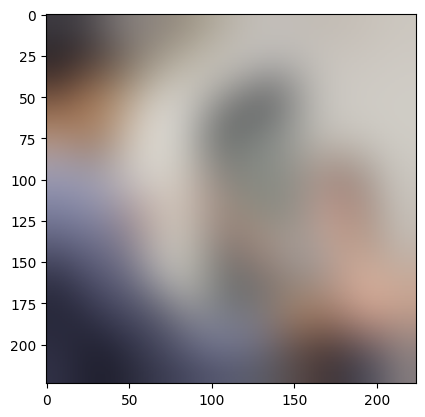

[[[ 1  2  3  4]
  [ 5  6  7  8]
  [ 9 10 11 12]
  [13 14 15 16]]]
Prediction for following image is 0.9575119


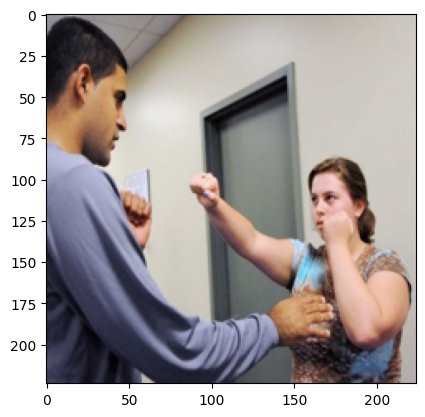

[[[ 0  0  0  0]
  [ 0  0  0  0]
  [ 9 10 11 12]
  [13 14 15 16]]

 [[ 1  2  3  4]
  [ 5  6  7  8]
  [ 0  0  0  0]
  [ 0  0  0  0]]]
Prediction for following image is 0.50720024


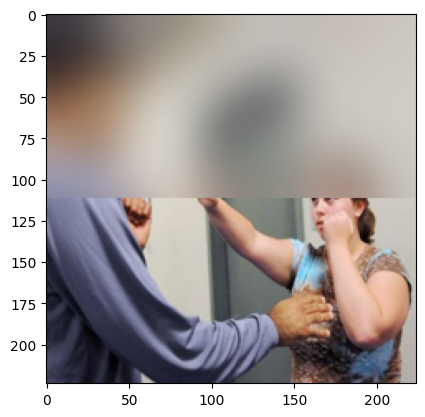

Prediction for following image is 0.8247967


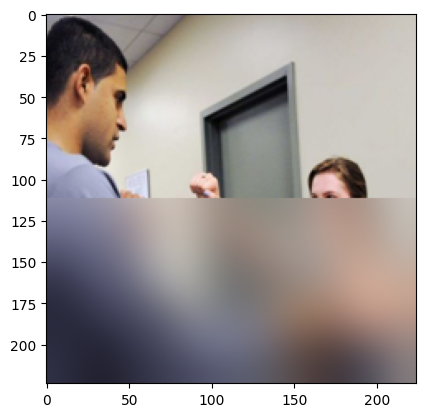

[[[ 0  0  0  0]
  [ 5  6  7  8]
  [ 0  0  0  0]
  [ 0  0  0  0]]

 [[ 1  2  3  4]
  [ 0  0  0  0]
  [ 0  0  0  0]
  [ 0  0  0  0]]

 [[ 0  0  0  0]
  [ 5  6  7  8]
  [ 9 10 11 12]
  [13 14 15 16]]

 [[ 1  2  3  4]
  [ 0  0  0  0]
  [ 9 10 11 12]
  [13 14 15 16]]

 [[ 0  0  0  0]
  [ 0  0  0  0]
  [ 0  0  0  0]
  [13 14 15 16]]

 [[ 0  0  0  0]
  [ 0  0  0  0]
  [ 9 10 11 12]
  [ 0  0  0  0]]

 [[ 1  2  3  4]
  [ 5  6  7  8]
  [ 0  0  0  0]
  [13 14 15 16]]

 [[ 1  2  3  4]
  [ 5  6  7  8]
  [ 9 10 11 12]
  [ 0  0  0  0]]]
Prediction for following image is 0.4838562


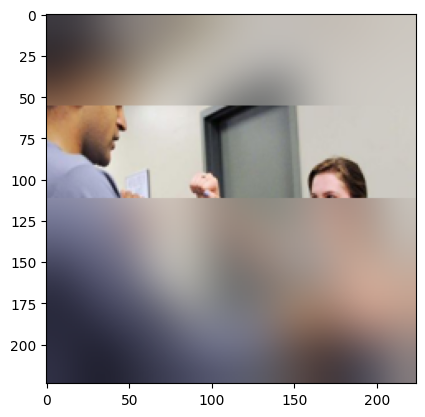

Prediction for following image is 0.29041672


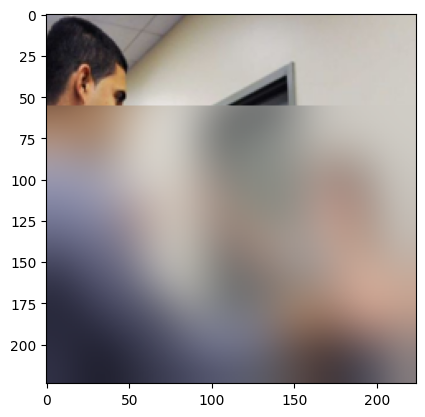

Prediction for following image is 0.80661964


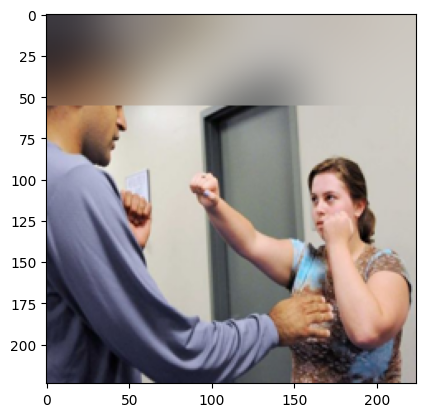

Prediction for following image is 0.7456989


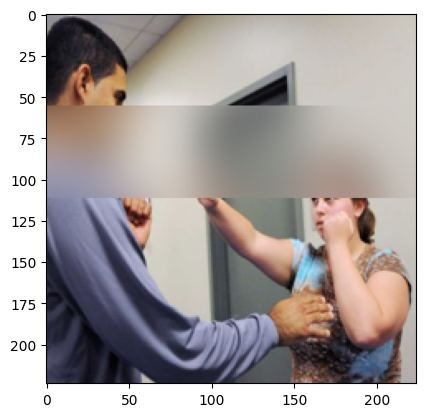

Prediction for following image is 0.47397995


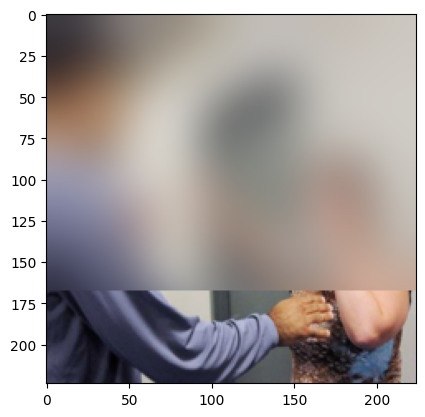

Prediction for following image is 0.6513443


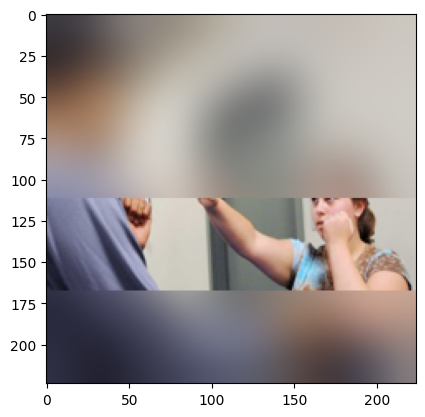

Prediction for following image is 0.4583416


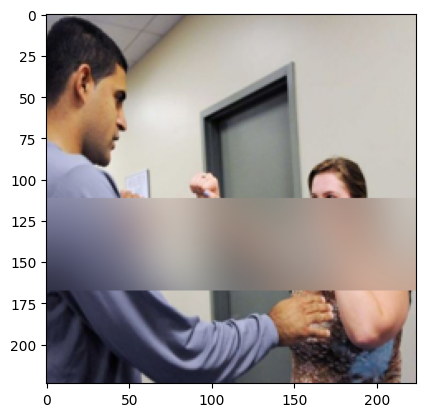

Prediction for following image is 1.2388802


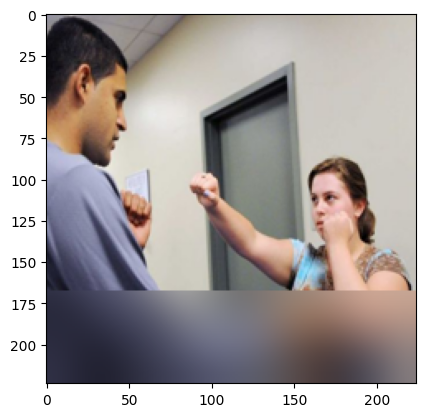

[[[ 1  2  3  4]
  [ 0  0  7  8]
  [ 0  0  0  0]
  [ 0  0  0  0]]

 [[ 1  2  3  4]
  [ 5  6  0  0]
  [ 0  0  0  0]
  [ 0  0  0  0]]

 [[ 1  2  3  4]
  [ 5  6  7  8]
  [ 0  0 11 12]
  [13 14 15 16]]

 [[ 1  2  3  4]
  [ 5  6  7  8]
  [ 9 10  0  0]
  [13 14 15 16]]

 [[ 1  2  3  4]
  [ 5  6  7  8]
  [ 0  0 11 12]
  [ 0  0  0  0]]

 [[ 1  2  3  4]
  [ 5  6  7  8]
  [ 9 10  0  0]
  [ 0  0  0  0]]

 [[ 1  2  3  4]
  [ 5  6  7  8]
  [ 0  0  0  0]
  [ 0  0 15 16]]

 [[ 1  2  3  4]
  [ 5  6  7  8]
  [ 0  0  0  0]
  [13 14  0  0]]

 [[ 0  0  3  4]
  [ 5  6  7  8]
  [ 0  0  0  0]
  [ 0  0  0  0]]

 [[ 1  2  0  0]
  [ 5  6  7  8]
  [ 0  0  0  0]
  [ 0  0  0  0]]

 [[ 0  0  0  0]
  [ 0  0  7  8]
  [ 9 10 11 12]
  [13 14 15 16]]

 [[ 0  0  0  0]
  [ 5  6  0  0]
  [ 9 10 11 12]
  [13 14 15 16]]

 [[ 0  0  0  0]
  [ 0  0  0  0]
  [ 0  0 11 12]
  [ 0  0  0  0]]

 [[ 0  0  0  0]
  [ 0  0  0  0]
  [ 9 10  0  0]
  [ 0  0  0  0]]

 [[ 1  2  3  4]
  [ 5  6  7  8]
  [ 9 10 11 12]
  [ 0  0 15 16]]

 [[ 1  2  

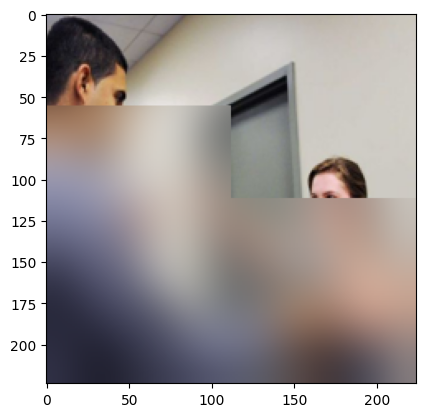

Prediction for following image is 0.47449684


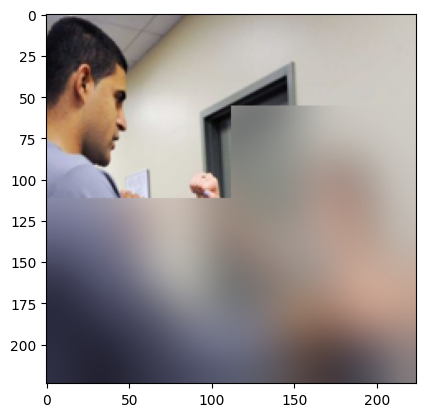

Prediction for following image is 0.6136589


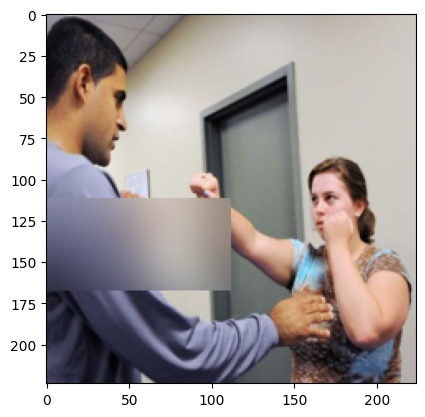

Prediction for following image is 0.48695183


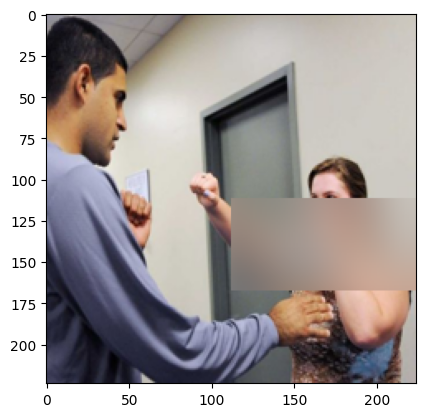

Prediction for following image is 1.1967068


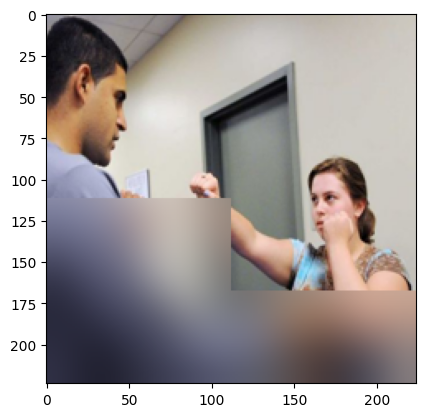

Prediction for following image is 0.87047005


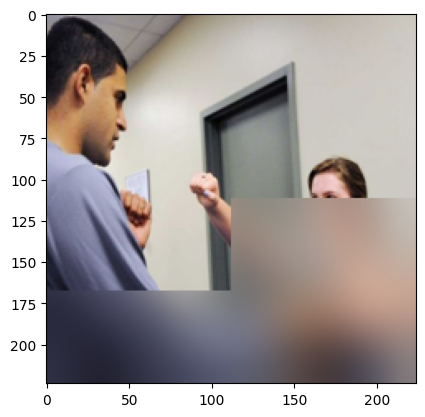

Prediction for following image is 0.5106869


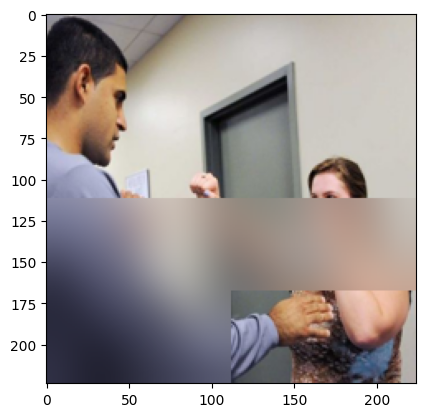

Prediction for following image is 0.73629


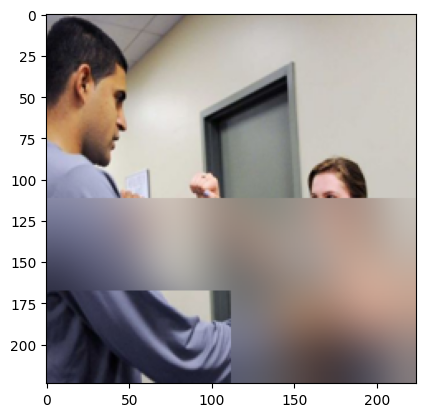

Prediction for following image is 0.6375046


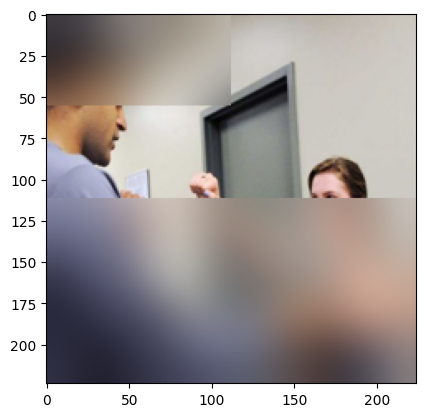

Prediction for following image is 0.7768879


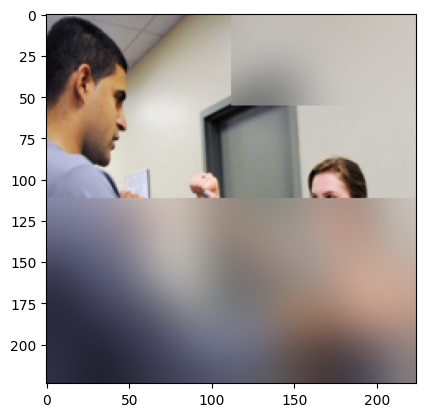

Prediction for following image is 0.6464634


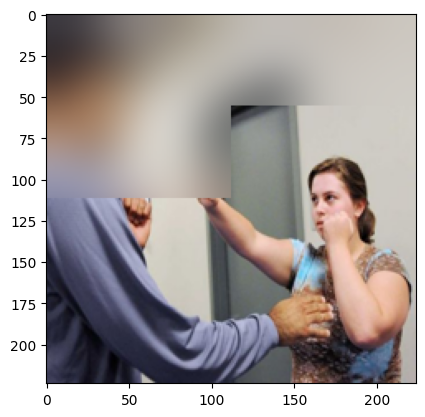

Prediction for following image is 0.64268684


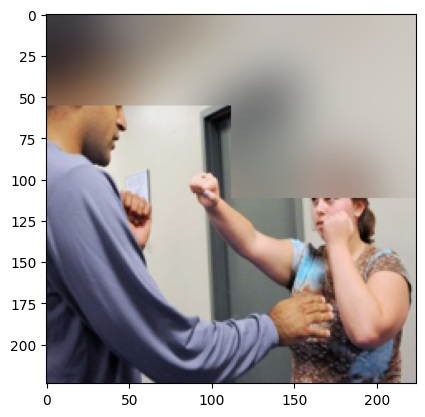

Prediction for following image is 0.77020836


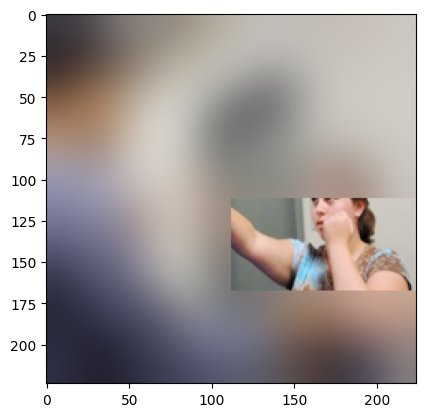

Prediction for following image is 0.18946075


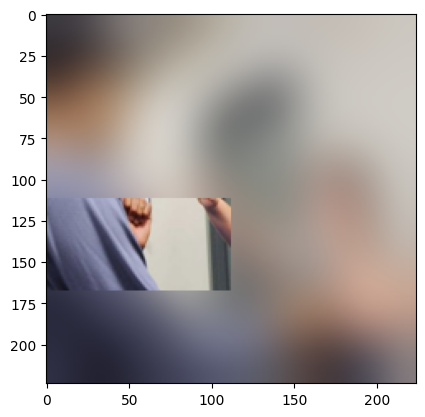

Prediction for following image is 0.96058464


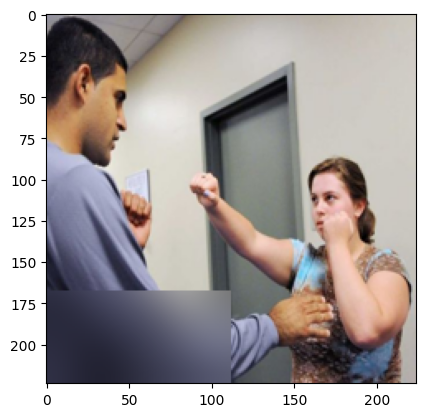

Prediction for following image is 1.0891094


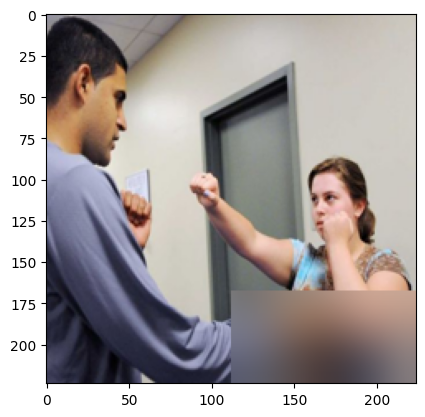

Prediction for following image is 0.550148


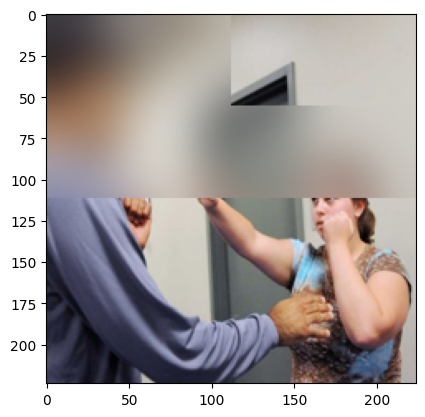

Prediction for following image is 0.75048447


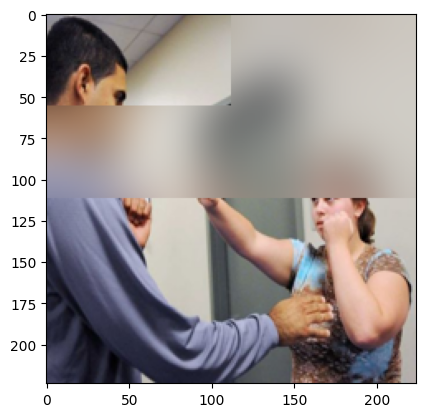

Prediction for following image is 0.64969635


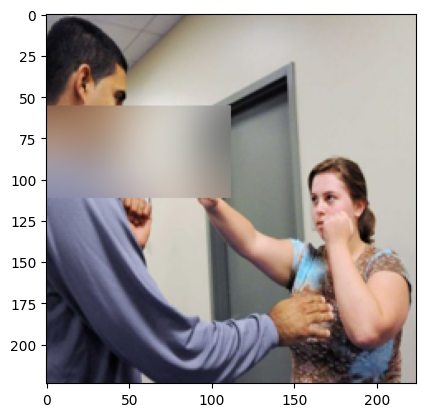

Prediction for following image is 0.7357235


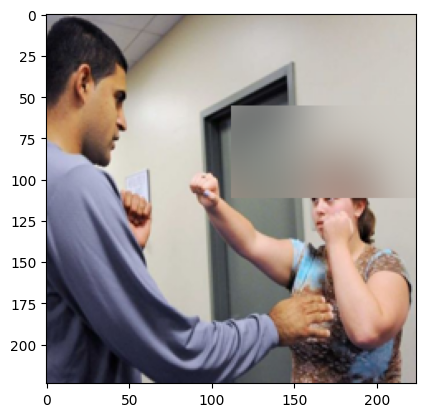

Prediction for following image is 0.77649117


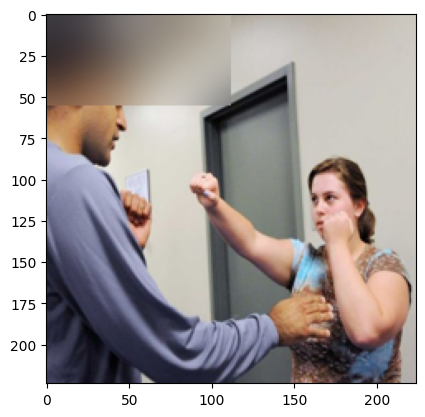

Prediction for following image is 0.8973808


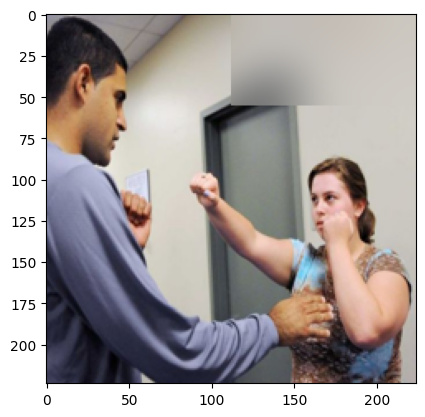

Prediction for following image is 0.40203285


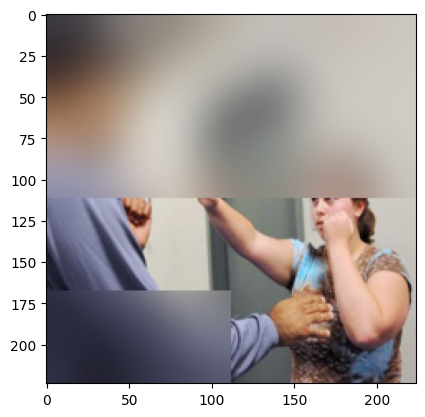

Prediction for following image is 0.6130676


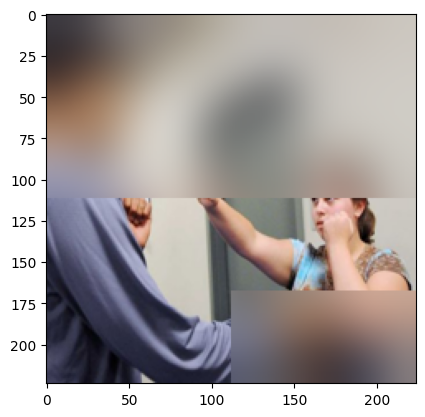

Prediction for following image is 0.1808281


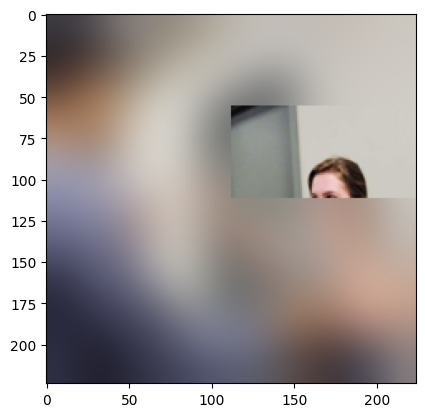

Prediction for following image is -0.015893936


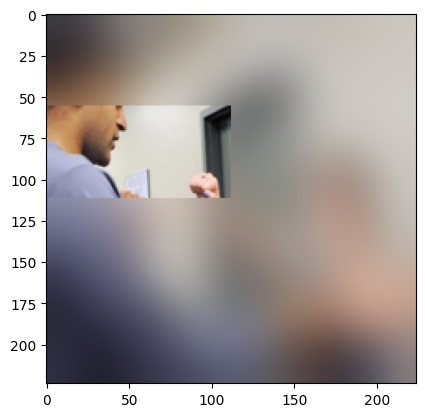

Prediction for following image is 0.5015278


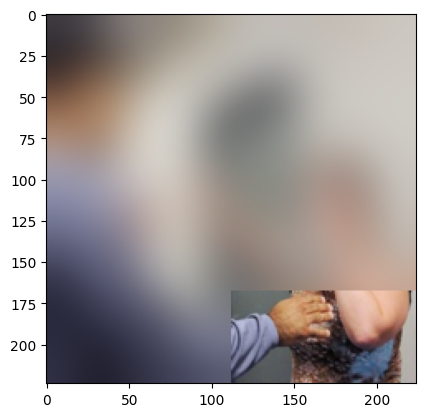

Prediction for following image is 0.14673233


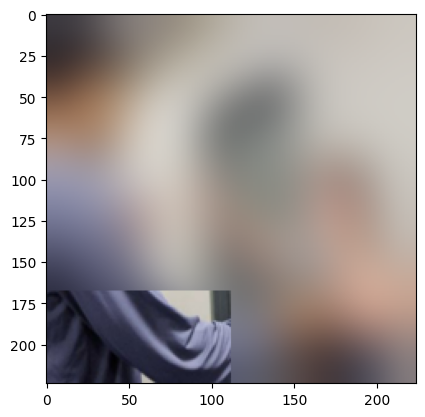

Prediction for following image is 0.16535187


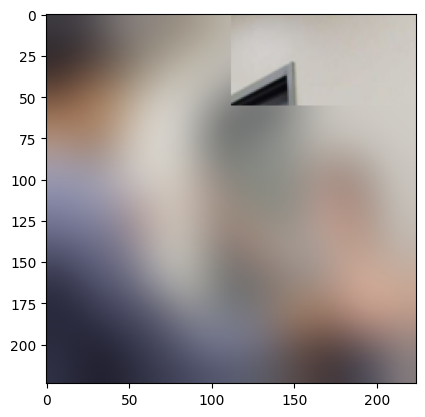

Prediction for following image is 0.2963314


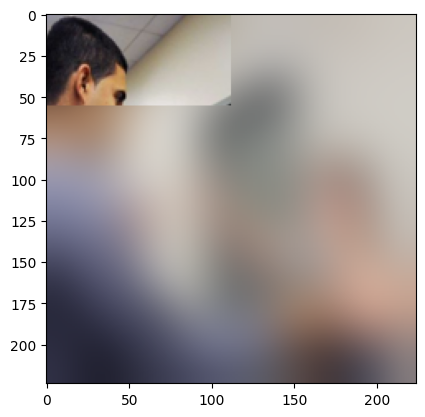

Prediction for following image is 0.5148144


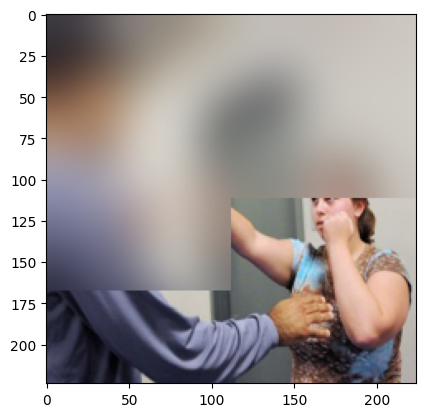

Prediction for following image is 0.44273567


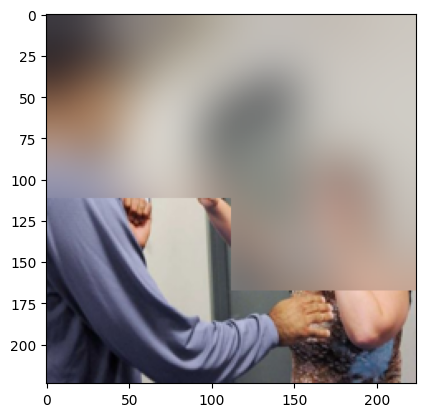

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


  0%|          | 0/240 [00:00<?, ?it/s]

[[[ 0  0  0  0]
  [ 5  6  0  8]
  [ 0  0  0  0]
  [ 0  0  0  0]]

 [[ 0  0  0  0]
  [ 5  6  7  0]
  [ 0  0  0  0]
  [ 0  0  0  0]]

 [[ 1  2  3  4]
  [ 5  6  7  8]
  [ 9 10  0 12]
  [13 14 15 16]]

 ...

 [[ 1  2  3  4]
  [ 5  6  7  8]
  [ 0  0 11  0]
  [13 14 15 16]]

 [[ 0  0  0  4]
  [ 5  6  7  8]
  [ 0  0  0  0]
  [ 0  0  0  0]]

 [[ 0  0  3  0]
  [ 5  6  7  8]
  [ 0  0  0  0]
  [ 0  0  0  0]]]
Prediction for following image is 0.47234344


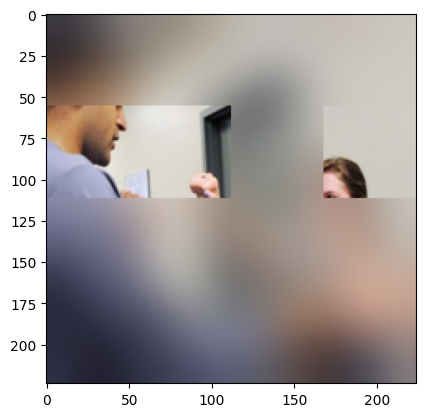

Prediction for following image is 0.17701149


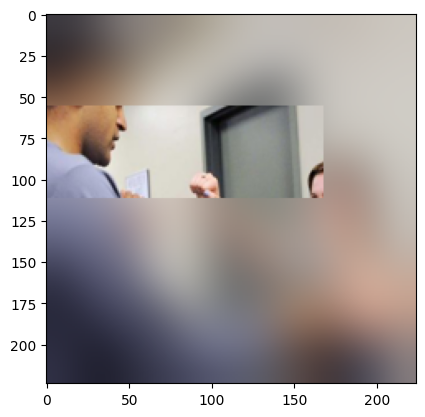

Prediction for following image is 0.6906109


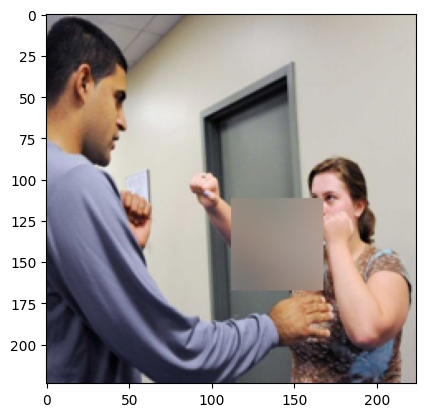

Prediction for following image is 0.8558006


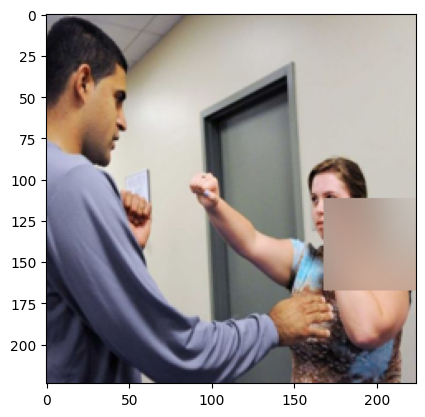

Prediction for following image is 0.3314743


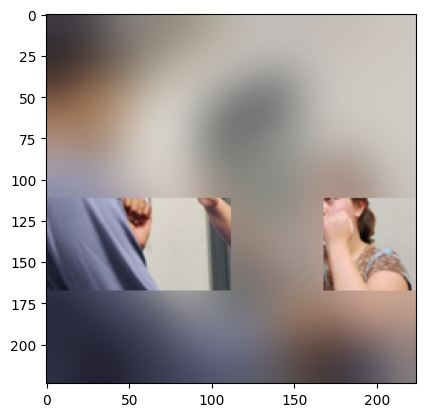

Prediction for following image is 0.3649845


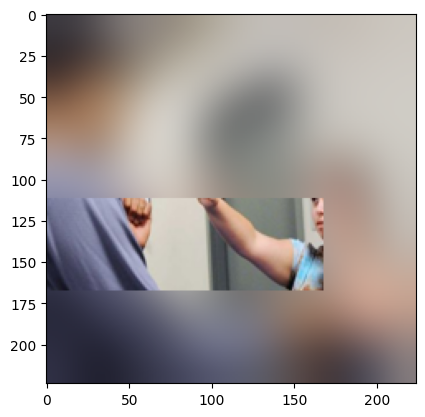

Prediction for following image is 0.5920677


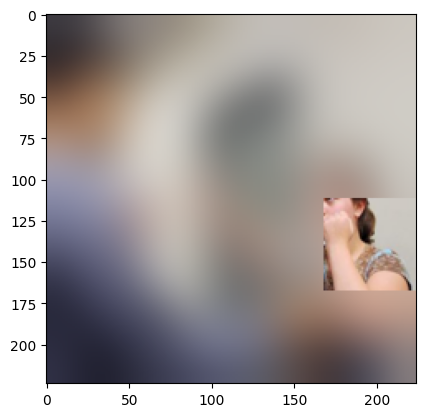

Prediction for following image is 0.26459503


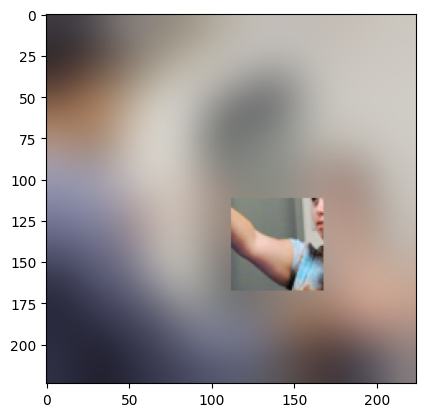

Prediction for following image is 0.76155853


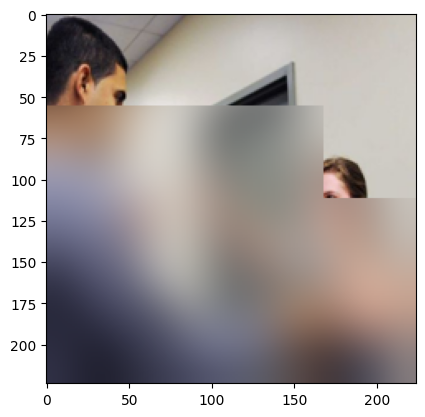

Prediction for following image is 0.545578


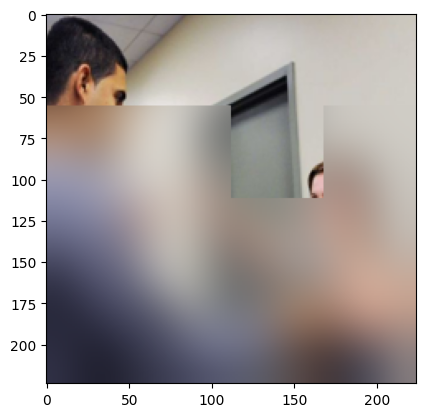

Prediction for following image is 0.09684181


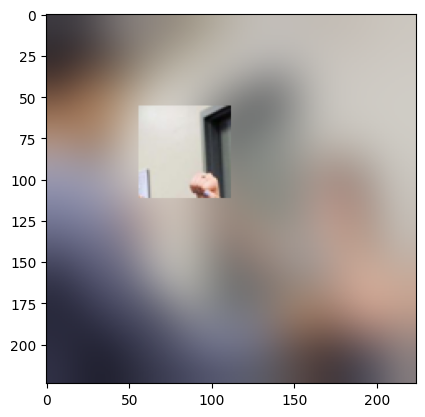

Prediction for following image is 0.060382843


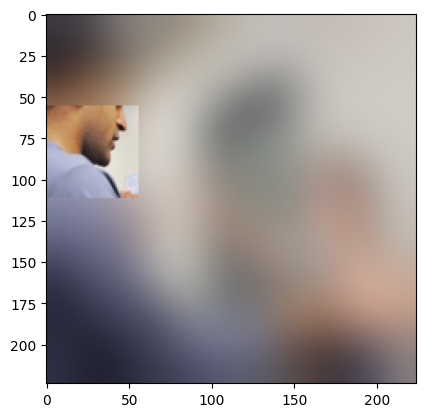

Prediction for following image is 1.083683


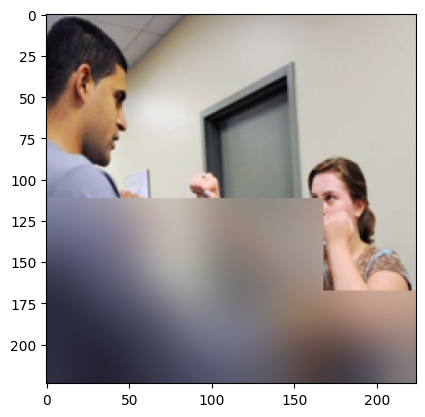

Prediction for following image is 0.92378616


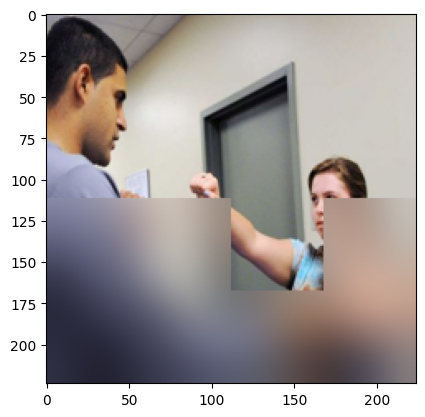

Prediction for following image is 1.0800552


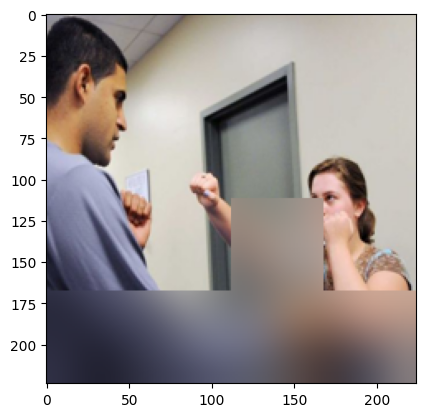

Prediction for following image is 1.0022888


KeyboardInterrupt: 

In [10]:

VERBOSE = 2 # maximum verbose 
DISPLAY_PLOTS = False
EXPORT_PLOTS = False

output = defaultdict(list)

stimuli_df = stimuli_df[stimuli_df['caption']=='A woman punches a man.']

for index, row in stimuli_df.iterrows():

    # note that if index is not reset this will go 1 to 33 three times.
    print(f"Processing stimulus {index+1} out of {len(stimuli_df)}")

    # copy main characteristics
    for name in ["img_path", "caption", "foil", "linguistic_phenomena"]:
        output[name].append(row[name])

    # calcualte shap map
    try:

        shap_map, n_variants = shap_functions.generate_shap(row['img_path'], row['caption'], row['foil'],
                                                                prediction_function=model_predict,
                                                                model=model,
                                                                model_name=model_name,
                                                                verbose=VERBOSE,
                                                                plots=DISPLAY_PLOTS,
                                                                export_plots=EXPORT_PLOTS,
                                                                return_variant_count=True)
        
        output["model_shap_map"].append(shap_map)
        output['n_image_variants'].append(n_variants)
    except Exception as e:
         output['model_shap_map'].append("Error: "+str(e))
         print(e)
         output['n_image_variants'].append("Error")
    1
final_model_shap_df = pd.DataFrame.from_dict(output)
    

In [ ]:
output

defaultdict(list,
            {'img_path': ['../../VALSE_data/images/v7w/v7w_2318073.jpg',
              '../../VALSE_data/images/v7w/v7w_2323857.jpg',
              '../../VALSE_data/images/v7w/v7w_2336798.jpg',
              '../../VALSE_data/images/v7w/v7w_2349587.jpg',
              '../../VALSE_data/images/v7w/v7w_2352298.jpg',
              '../../VALSE_data/images/v7w/v7w_2360434.jpg',
              '../../VALSE_data/images/v7w/v7w_2362476.jpg',
              '../../VALSE_data/images/v7w/v7w_2389519.jpg',
              '../../VALSE_data/images/v7w/v7w_2393355.jpg',
              '../../VALSE_data/images/v7w/v7w_2411942.jpg',
              '../../VALSE_data/images/v7w/v7w_2417412.jpg',
              '../../VALSE_data/images/swig/speaking_84.jpg',
              '../../VALSE_data/images/swig/tripping_125.jpg',
              '../../VALSE_data/images/swig/punching_28.jpg',
              '../../VALSE_data/images/swig/handcuffing_40.jpg',
              '../../VALSE_data/images/swig/car

In [ ]:
for key in output.keys():
    print(key, len(output[key]))

img_path 2
caption 2
foil 2
linguistic_phenomena 2
model_shap_map 2


### Find which if any stimuli threw an error

In [ ]:
final_model_shap_df[final_model_shap_df['model_shap_map'].apply(isinstance, args=(str,))]

,img_path,caption,foil,linguistic_phenomena,model_shap_map


In [ ]:
plt.imshow(final_clip_shap_df['clip_shap_map'][0])

NameError: name 'final_clip_shap_df' is not defined